In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Demo of the code

Code by Julien Ars, created for a project with EPFL's [LUTS laboratory](luts.epfl.ch) under the supervision of Minru Wang and Prof Geroliminis.

This package allows the user to retrieve data about public transport lines in Switzerland, as well as creating pairs of coordinates that associate (fictitious) shops and customers based on OFS public geostat (STATENT and STATPOP) data.

It implements a robust download manager that checks whether a file has already been downloaded and can also unzip files as well as check the latest available data (for example, with public transport data).

The public transport data comes from [opentransportdata.swiss], in particular the ['Actual Data'](https://opentransportdata.swiss/en/dataset/istdaten) and the ['Service points'](https://opentransportdata.swiss/en/dataset/service-points-full) services.

The package provides the following classes :

## Area

A class to encode geographical data, with a plotting fonctionality (using maps from CARTO) and methods to test whether coordinates are inside the area.

In [3]:
from code_files.area import Area

c:\Users\arsju\OneDrive\Documents\1 Etudes\EPFL MA3 2024-2025\PROJETS\DRONES\code_files\area.py:96: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


(<Figure size 1600x1822.94 with 1 Axes>, <Axes: >)

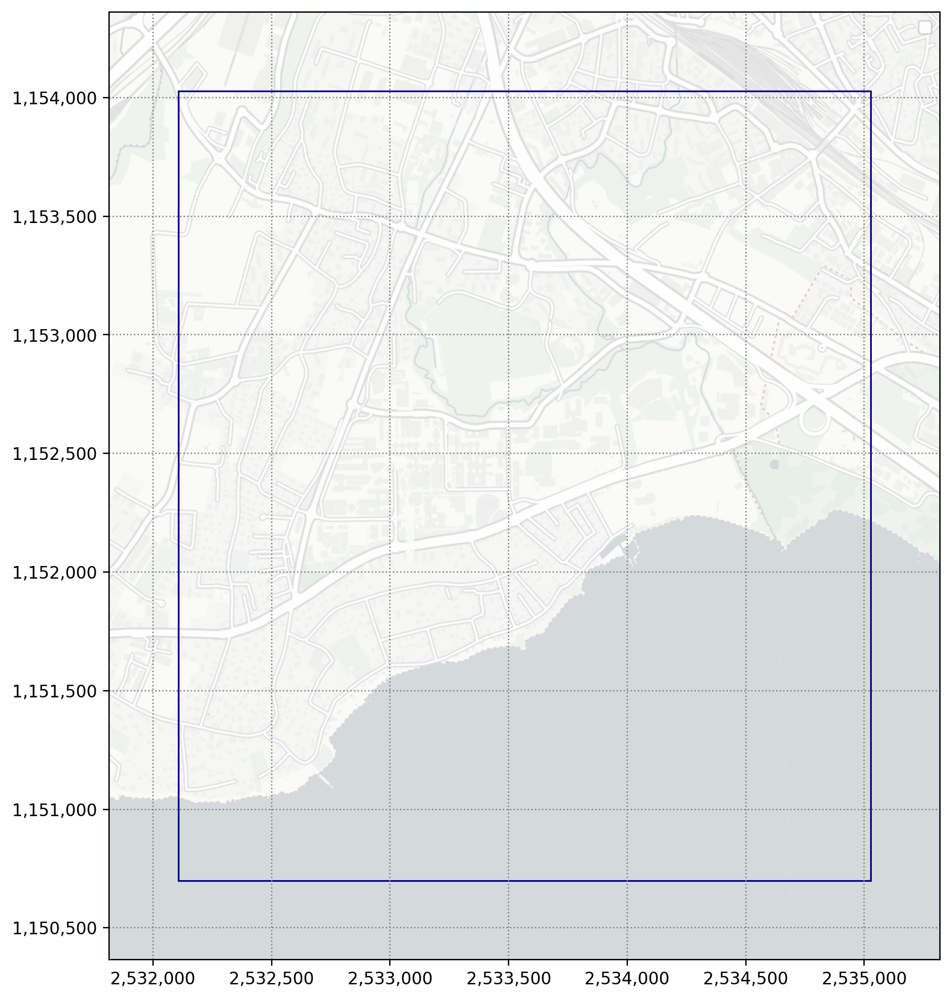

In [4]:
epfl = Area(2532106, 2535027, 1150700, 1154028)
epfl.plot(margin=0.1)

## Tasks.geostat.STAT

> Children : Tasks.geostat.STATPOP, Tasks.geostat.STATENT

A class that has capacity to generate dots for data that comes per hectare. Hectares are randomly chosen based on one of the statistics (number of people living there, etc...) and a random point in the selected hectare is then generated

In [5]:
from code_files.Tasks.geostat import STATPOP, STATENT

### Tasks.geostat.STATPOP

In [6]:
population = STATPOP(epfl)
population.df

,POSITION_X,POSITION_Y,POPULATION
18317,2532100,1151000,6
18318,2532100,1151100,6
18319,2532100,1151200,9
18320,2532100,1151300,30
18321,2532100,1151400,73
...,...,...,...
20105,2535000,1153200,54
20106,2535000,1153300,3
20107,2535000,1153800,52
20108,2535000,1153900,98


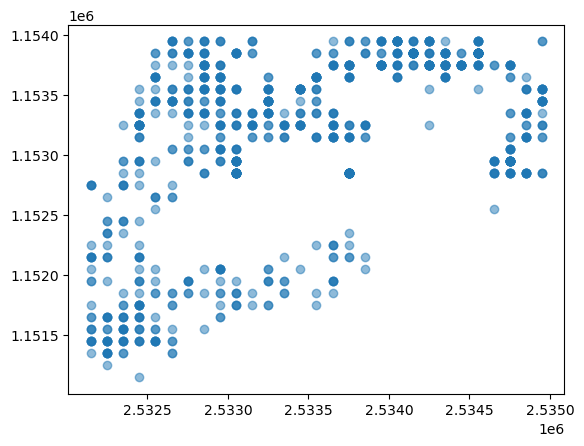

array([[2532250., 1151350.],
       [2533850., 1153850.],
       [2534250., 1153750.],
       ...,
       [2532850., 1153650.],
       [2534650., 1152850.],
       [2532350., 1151650.]], shape=(1000, 2))

In [7]:
pop_demand = population.generate_n(1000, seed = 10)
plt.scatter(pop_demand[:, 0], pop_demand[:, 1], alpha=0.5)
plt.show()
pop_demand

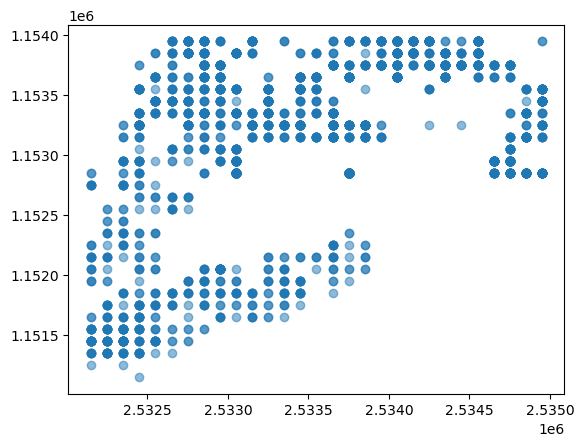

In [8]:
pop_demand2 = population.generate_per_proportion(0.1, seed = 100)
plt.scatter(pop_demand2[:, 0], pop_demand2[:, 1], alpha=0.5)

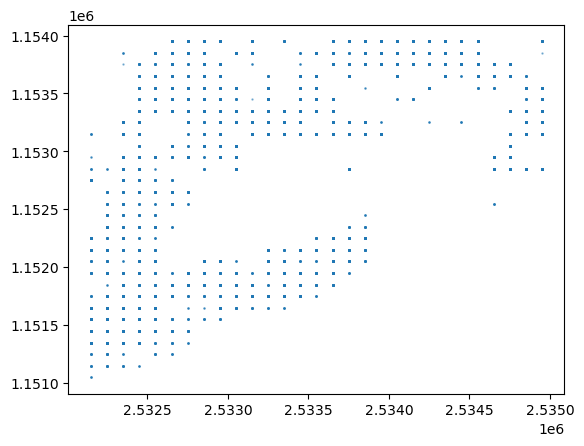

array([[2533250., 1153450.],
       [2533050., 1153350.],
       [2533150., 1151950.],
       ...,
       [2532750., 1152950.],
       [2534650., 1153750.],
       [2533450., 1153250.]], shape=(27262, 2))

In [9]:
pop_demand_jitter = population.generate_per_proportion(proportion=1, precision_in_meter=1, seed = 100)
plt.scatter(pop_demand_jitter[:, 0], pop_demand_jitter[:, 1], alpha=0.5, s=0.5)
plt.show()
pop_demand_jitter

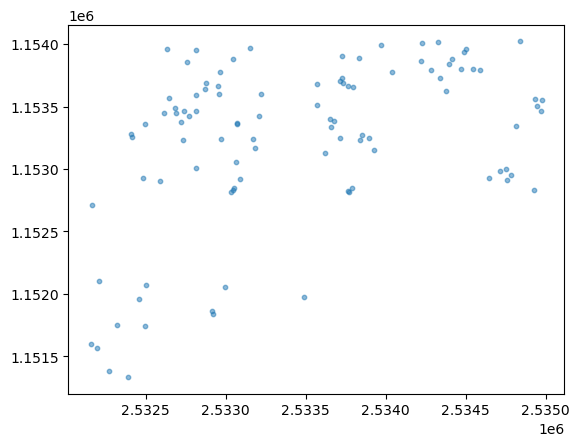

In [10]:
pop_demand_jitter = population.generate_n(100, precision_in_meter=1, seed = 100)
plt.scatter(pop_demand_jitter[:, 0], pop_demand_jitter[:, 1], alpha=0.5, s=10)
plt.show()

### Tasks.geostat.STATENT

In [11]:
statent = STATENT(epfl)
statent.df

,POSITION_X,POSITION_Y,SHOPS,SHOPS_EMP,SHOPS_ETP,SHOPS_0,SHOPS_10,SHOPS_50,SHOPS_250
12331,2532100,1151300,0,0,0.0,0,0,0,0
12332,2532100,1151400,0,0,0.0,0,0,0,0
12333,2532100,1151500,0,0,0.0,0,0,0,0
12334,2532100,1151700,0,0,0.0,0,0,0,0
12335,2532100,1151900,0,0,0.0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
13730,2535000,1153600,0,0,0.0,0,0,0,0
13731,2535000,1153700,0,0,0.0,0,0,0,0
13732,2535000,1153800,0,0,0.0,0,0,0,0
13733,2535000,1153900,4,4,4.0,4,0,0,0


In [12]:
entreprises = statent.get_entreprises(1, seed=100)
entreprises.df

,POSITION_X,POSITION_Y,SHOPS_EMP,SHOPS_ETP
0,2532287.5,1152453.5,1.00,1.000000
1,2532224.5,1152467.5,1.00,1.000000
2,2532242.5,1152404.5,1.00,1.000000
3,2532297.5,1152495.5,1.00,1.000000
4,2532326.5,1151329.5,3.75,2.904415
...,...,...,...,...
213,2535010.5,1153288.5,3.25,2.989389
215,2535022.5,1153461.5,2.25,1.891667
220,2535015.5,1153564.5,1.00,1.000000
221,2535019.5,1153505.5,1.00,1.000000


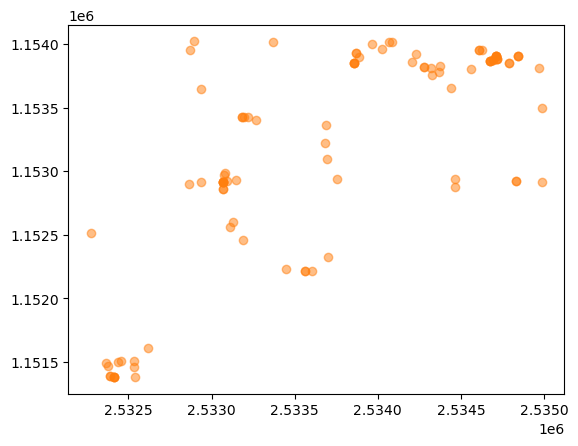

array([[2534708.5, 1153906.5],
       [2532390.5, 1151390.5],
       [2534462.5, 1152874.5],
       [2534695.5, 1153877.5],
       [2533755.5, 1152935.5],
       [2533094.5, 1152921.5],
       [2533109.5, 1152559.5],
       [2534708.5, 1153906.5],
       [2532893.5, 1154021.5],
       [2532532.5, 1151510.5],
       [2534628.5, 1153952.5],
       [2534968.5, 1153814.5],
       [2532274.5, 1152517.5],
       [2533859.5, 1153852.5],
       [2534676.5, 1153870.5],
       [2534438.5, 1153657.5],
       [2534715.5, 1153879.5],
       [2533070.5, 1152914.5],
       [2534987.5, 1153496.5],
       [2534715.5, 1153879.5],
       [2533967.5, 1153998.5],
       [2532862.5, 1152897.5],
       [2534606.5, 1153950.5],
       [2533561.5, 1152214.5],
       [2533606.5, 1152218.5],
       [2534368.5, 1153778.5],
       [2533859.5, 1153852.5],
       [2534561.5, 1153800.5],
       [2534324.5, 1153760.5],
       [2534676.5, 1153870.5],
       [2533867.5, 1153931.5],
       [2534985.5, 1152919.5],
       [

In [13]:
ent_sources = entreprises.generate_n(100, seed = 10)
plt.scatter(ent_sources[:, 0], ent_sources[:, 1], alpha=0.5, c="C1")
plt.show()
ent_sources

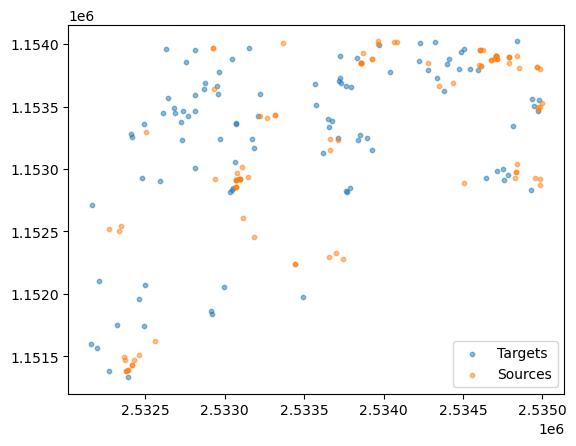

In [14]:
pop_demand_jitter = population.generate_n(100, 1, seed = 100)
plt.scatter(pop_demand_jitter[:, 0], pop_demand_jitter[:, 1], alpha=0.5, s=10, label="Targets")
ent_sources_jitter = entreprises.generate_n(100, seed = 200)
plt.scatter(ent_sources_jitter[:, 0], ent_sources_jitter[:, 1], alpha=0.5, s=10, c="C1", label="Sources")
plt.legend()
plt.show()

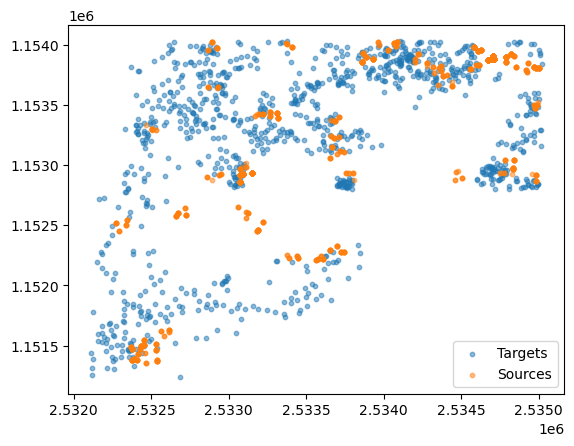

In [15]:
pop_demand_jitter = population.generate_n(1000, 1, seed = 100)
plt.scatter(pop_demand_jitter[:, 0], pop_demand_jitter[:, 1], alpha=0.5, s=10, label="Targets")
ent_sources_jitter = entreprises.generate_n(1000, seed = 200)
plt.scatter(ent_sources_jitter[:, 0], ent_sources_jitter[:, 1], alpha=0.5, s=10, c="C1", label="Sources")
plt.legend()
plt.show()

## TaskManager

A class that, for a given area, allows to generate a certain number of tasks (pair of pickup and delivery coordinates) based on the STATPOP and STATENT data. It also implements a method (`.compute_improvement(tasks, lines)`) that allows to compute the best bus line out of `lines` for each task, the difference in drone travel distance as well as the bus stops it would use.

In [16]:
from code_files.Tasks.taskManager import TaskManager

In [17]:
tasks_manager = TaskManager(epfl, random_seed=100)
tasks_manager.get_tasks(100, random_seed=100)

,pickup_x,pickup_y,delivery_x,delivery_y,distance
0,2533895.5,1153945.5,2533676.5,1153383.5,603.162499
1,2533099.5,1152884.5,2532912.5,1151859.5,1041.918423
2,2533416.5,1152219.5,2533208.5,1153428.5,1226.761998
3,2534668.5,1153926.5,2534544.5,1153804.5,173.954017
4,2532279.5,1152481.5,2532158.5,1151597.5,892.242680
...,...,...,...,...,...
95,2534604.5,1153953.5,2534337.5,1153731.5,347.236231
96,2533685.5,1153190.5,2533728.5,1153905.5,716.291840
97,2534655.5,1153915.5,2532959.5,1153600.5,1725.004638
98,2532258.5,1152534.5,2534646.5,1152927.5,2420.122518


c:\Users\arsju\OneDrive\Documents\1 Etudes\EPFL MA3 2024-2025\PROJETS\DRONES\code_files\area.py:96: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


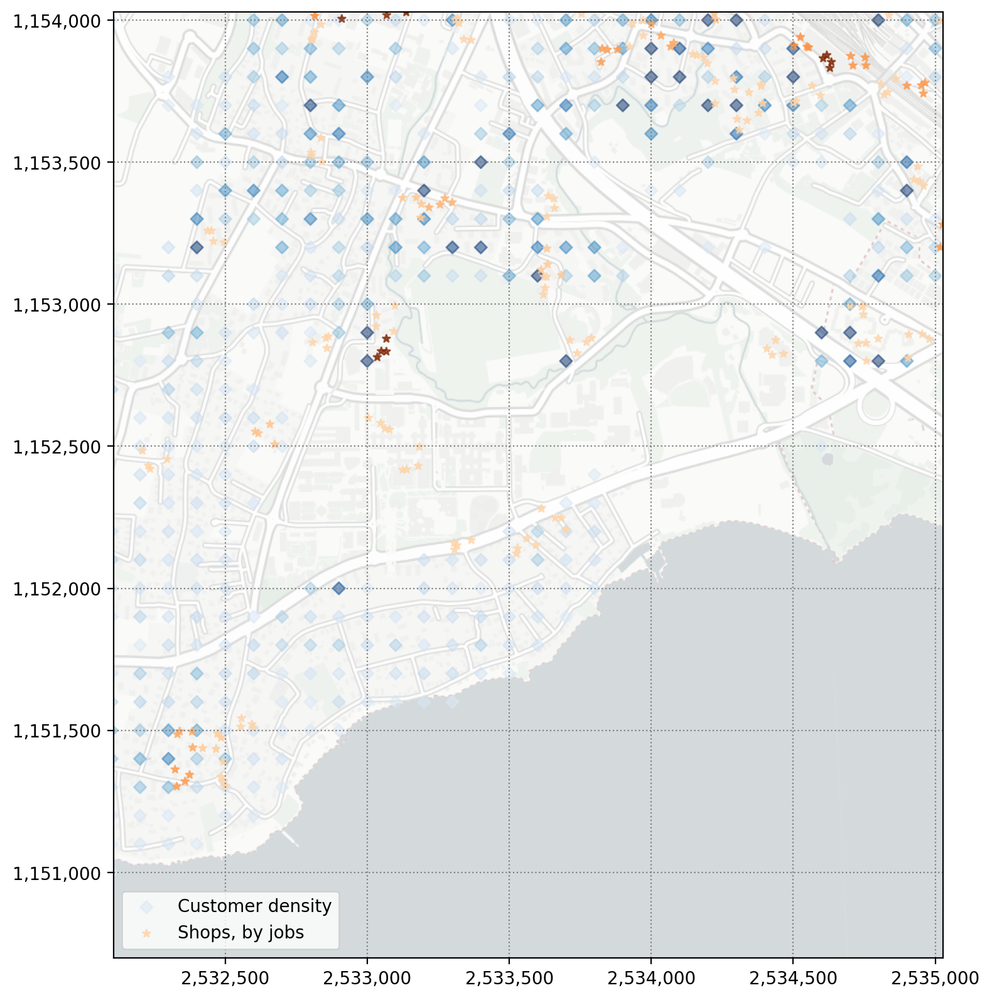

In [18]:
tasks_manager.plot()
plt.legend(scatterpoints=1)

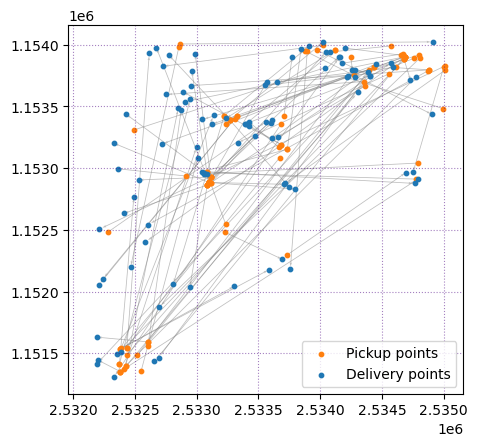

In [19]:
plt.figure()
tasks_manager.plot(plt.gca(), tasks_manager.get_tasks(100))
plt.gca().set_aspect("equal")
plt.grid(linestyle=":", color="indigo", alpha=0.5)
plt.legend(scatterpoints=1)

c:\Users\arsju\OneDrive\Documents\1 Etudes\EPFL MA3 2024-2025\PROJETS\DRONES\code_files\area.py:96: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


<Axes: >

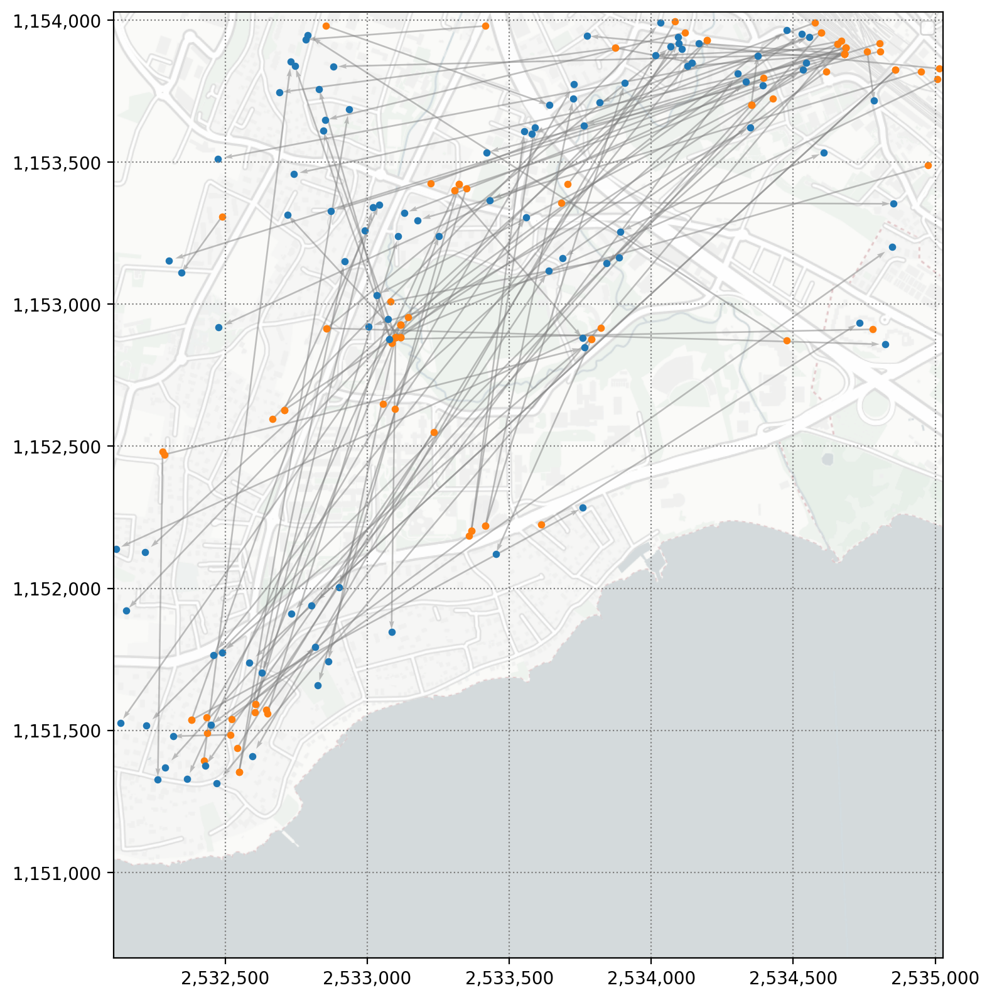

In [20]:
tasks_manager.plot(tasks=tasks_manager.get_tasks(100))

## Mapping

Any `Area`, `LineData`, `LinesData` or `TaskManager` instance implement a `.plot` method. Calling the plot method of an area, we can specify elements in the args, with potential arguments in a tuple. For example, one can ask to plot tasks and bus lines by specifying `area.plot((task_manager, *tm_args), (line_data, ld_kwargs))`, where `tm_args` are arguments for the `task_manager.plot` method and `ld_kwargs` a dict countaining the keywords arguments for `line_data.plot` method (if the second element of the tuple is a dict, it is interpreted as a dict of keywords arguments)

C:\Users\arsju\AppData\Local\Temp\ipykernel_41448\452404753.py:2: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


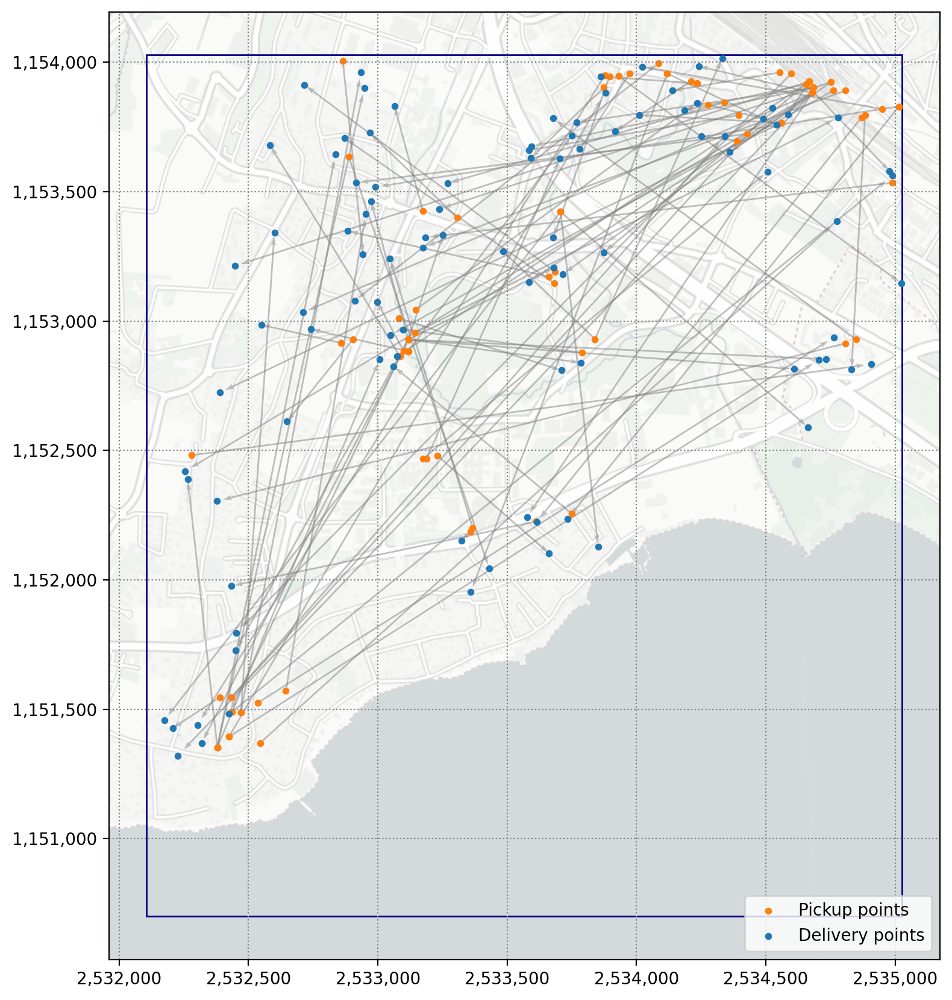

In [21]:
fig, ax = epfl.plot((tasks_manager, tasks_manager.get_tasks(100, random_seed=10)), margin=0.05)
fig.show()

## TransportData

A class to download the transport data at a given date, then filter it and finally process it to give an output. It accepts an area or a line id to filter the data, and then can be called to get only the results of some modes of transport.

In [22]:
from code_files.PublicTransport.processing import TransportData

In [23]:
tp = TransportData("epfl", epfl, date = (2025,1,3))
tp.download_data(date_strict=False)

('raw_data\\1_downloaded\\Stops_2025-01-03.csv',
 'raw_data\\1_downloaded\\Timetable_2025-01-03.csv')

In [24]:
tp.filter_data(return_data=False)

In [25]:
lines = tp.get_lines_data()

85:151:1


c:\Users\arsju\anaconda3\envs\oldFolium\Lib\site-packages\scipy\interpolate\_interpolate.py:479: RuntimeWarning: invalid value encountered in divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]


Still 4 distances values missing for line 1 (85:151:1)
                       STOP_NAME  POSITION_X  POSITION_Y  DISTANCE
STOP_NUMBER                                                       
8592001         Lausanne, Boston   2537405.0   1152837.0       NaN
8592010      Lausanne, Chauderon   2537555.0   1152802.0       NaN
8592102         Lausanne, Prélaz   2536612.0   1153116.0       NaN
8592109       Lausanne, Recordon   2537035.0   1153025.0       NaN

Dropping routes Route_G, Route_H, Route_J as their similitude with Route_A is smaller than the threshold (5)
Consequently, dropping journeys 85:151:106, 85:151:137, 85:151:220, 85:151:239, 85:151:134

85:151:24
85:151:25
85:151:31
85:151:32
85:151:33
Removing 154 duplicates for line 33 (85:151:33)
85:151:70
85:151:95
Removing 3 duplicates for line N5 (85:151:95)
85:764:701
Removing 91 duplicates for line 701 (85:764:701)
85:764:705
Removing 2 duplicates for line 705 (85:764:705)


### LineData and LinesData

The output of `TransportData.get_line_data()`, classes that ease the manipulation of bus lines. In particular, `LinesData` is an extension of the `dict` class, that allows getting the individual lines (in instances of `LineData`) by their name or id (or a key if you added the line through `LinesData[key] = LineData`)

In [37]:
from code_files.PublicTransport.linedata import LineData, LinesData

In [38]:
l705 = lines["85:764:705"]
l705.stops

,STOP_NUMBER,POSITION_X,POSITION_Y,DISTANCE,Route_A,Route_B,Route_C,Route_D,Route_E
STOP_NAME,,,,,,,,,
"Lonay, parc",8592254,2.529262e+06,1.153429e+06,0.000000,True,True,False,False,True
"Lonay, Pressoirs",8595219,2.529507e+06,1.153105e+06,406.249783,True,True,False,False,False
"Lonay-Préverenges, gare nord",8511344,2.529439e+06,1.152899e+06,623.392256,True,True,False,False,False
"Lonay-Préverenges, gare sud",8595218,2.529592e+06,1.152847e+06,785.302906,True,True,False,False,True
"Préverenges, Capellan",8588898,2.529954e+06,1.152437e+06,1332.243488,True,True,False,False,True
"Préverenges, village",8579230,2.529987e+06,1.152190e+06,1581.438191,True,True,False,False,True
"Denges, Pierraz-Mur",8592240,2.530776e+06,1.151938e+06,2409.704452,True,True,False,False,True
"Denges, Sur les Moulins",8592241,2.531176e+06,1.151922e+06,2810.056770,True,True,False,False,True
"Denges, La Pale",8592239,2.531209e+06,1.152348e+06,3236.733360,True,True,False,False,True


(<Figure size 1600x1822.94 with 1 Axes>, <Axes: >)

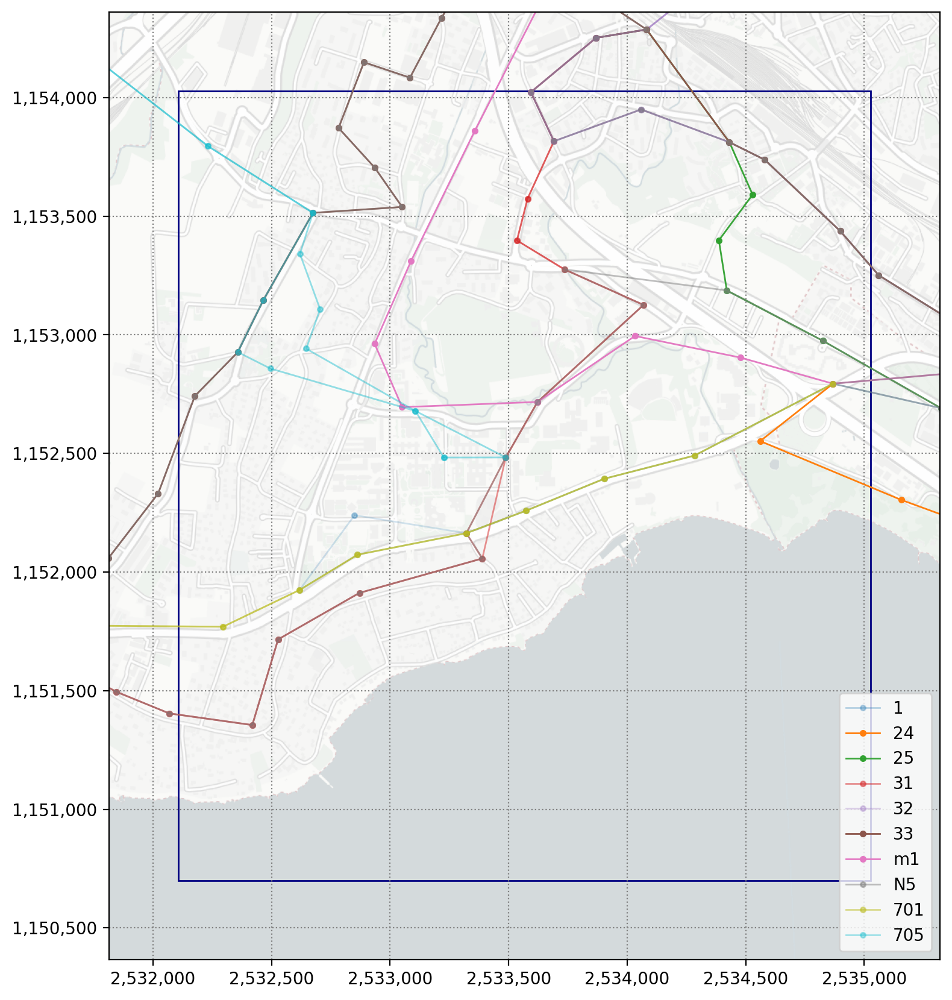

In [39]:
epfl.plot((lines, False), margin=0.1)

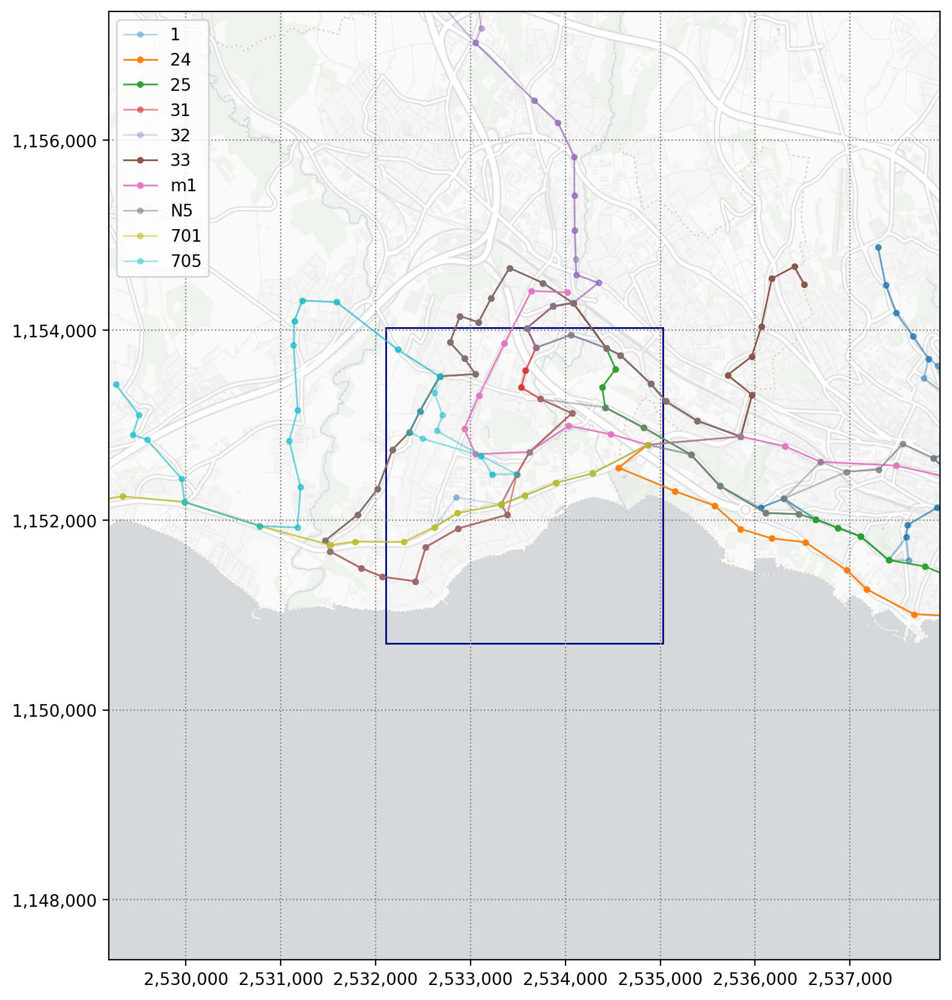

In [40]:
fig, ax = epfl.plot(*lines.values(), margin=1)
plt.show()

In [41]:
l = LinesData()
l


LinesData object, with 0 lines registered
Registered line names : 
Registered line ids : 
Registered keys to access lines : 
        

In [42]:
l["l705"] = l705
l


LinesData object, with 1 line registered
Registered line names : 705
Registered line ids : 85:764:705
Registered keys to access lines : 'l705'
        

c:\Users\arsju\OneDrive\Documents\1 Etudes\EPFL MA3 2024-2025\PROJETS\DRONES\code_files\area.py:96: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


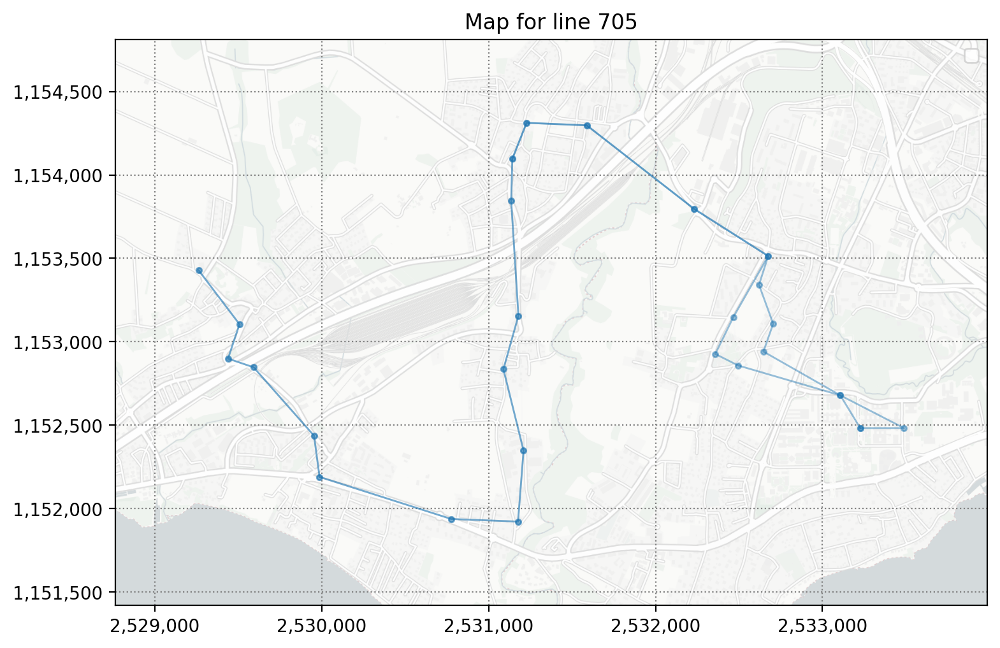

In [44]:
l["85:764:705"].plot()